# Object Detection for Assignment 3 Using Faster RCNN

We will use the https://github.com/GitarthVaishnav/FasterRCNN42028.git repository for this part of the assignment

# Step 1: Clone the Repository

In [ ]:
!git clone https://github.com/GitarthVaishnav/FasterRCNN42028.git

Cloning into 'FasterRCNN42028'...
remote: Enumerating objects: 124, done.
remote: Counting objects: 100% (124/124), done.
remote: Compressing objects: 100% (84/84), done.
remote: Total 124 (delta 51), reused 108 (delta 37), pack-reused 0
Receiving objects: 100% (124/124), 4.28 MiB | 26.08 MiB/s, done.
Resolving deltas: 100% (51/51), done.


Enter the repo directory.

In [ ]:
%cd FasterRCNN42028/

/content/FasterRCNN42028


# Step 2: Create new environment and install the requirements

Create new environment

In [ ]:
!pip install virtualenv
!virtualenv newenvi
!source newenvi/bin/activate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 84.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.5/468.5 kB 50.0 MB/s eta 0:00:00
created virtual environment CPython3.10.11.final.0-64 in 1756ms
  creator CPython3Posix(dest=/content/FasterRCNN42028/newenvi, clear=False, no_vcs_ignore=False, global=False)
  seeder FromAppData(download=False, pip=bundle, setuptools=bundle, wheel=bundle, via=copy, app_data_dir=/root/.local/share/virtualenv)
    added seed packages: pip==23.1.2, setuptools==67.7.2, wheel==0.40.0
  activators BashActivator,CShellActivator,FishActivator,NushellActivator,PowerShellActivator,PythonActivator


Install the requirements

In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.3/776.3 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 56.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 62.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 82.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 952.4/952.4 kB 83.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 50.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 94.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 18.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.5/206.5 kB 27.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 

# Step 3: Preprocessing

The lines in this step were created with the help of chat gpt 3

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


The images and annotations couldnt be joined into one project and exported because CVAT crashed. Hence, we will join all the folders from the different tasks into one folder using python after uploading all these individual folders (exported with pascal voc format) to google drive.

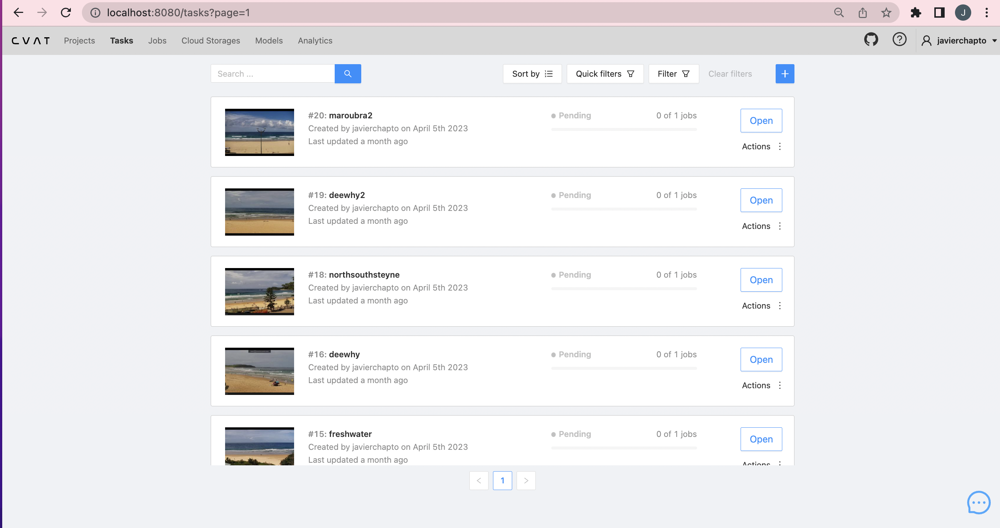

# Step 3.1 Include folder name in filenames (jpg and xml)

First we will have to include the name of the folder in the name of the files (images and annotations), which are currently like this:

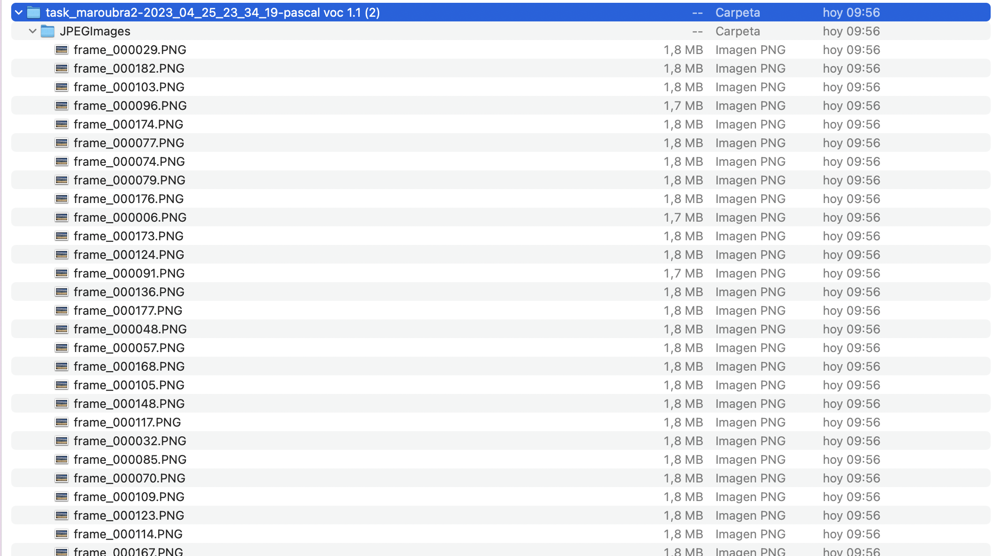

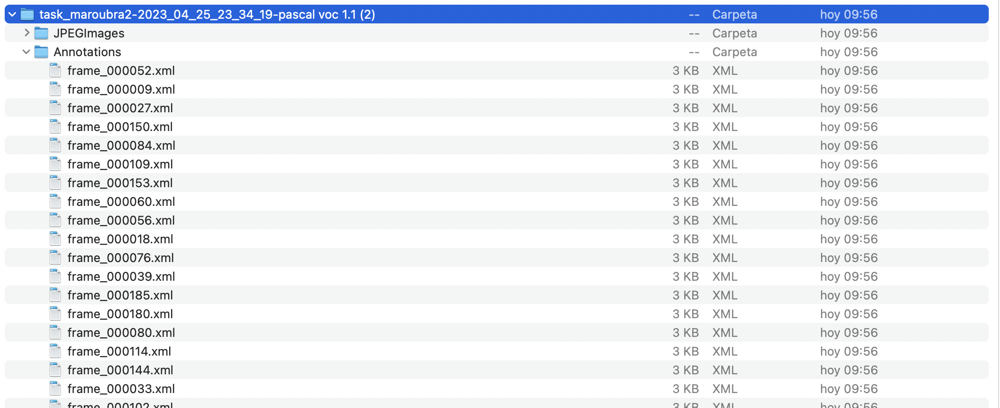

The cells below do this for each of the tasks

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/Annotations_freshwater'

# set the word to add to the beginning of the filename
prefix = 'freshwater_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/images_freshwater'

# set the word to add to the beginning of the filename
prefix = 'freshwater_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/Annotations_manly'

# set the word to add to the beginning of the filename
prefix = 'manly_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/images_manly'

# set the word to add to the beginning of the filename
prefix = 'manly_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/Annotations_queenscliff'

# set the word to add to the beginning of the filename
prefix = 'queenscliff_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/images_queenscliff'

# set the word to add to the beginning of the filename
prefix = 'queenscliff_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/annotations_beachsamples'

# set the word to add to the beginning of the filename
prefix = 'beachsamples_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/images_beachsamples'

# set the word to add to the beginning of the filename
prefix = 'beachsamples_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/annotations_deewhy'

# set the word to add to the beginning of the filename
prefix = 'deewhy_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/images_deewhy'

# set the word to add to the beginning of the filename
prefix = 'deewhy_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/annotations_deewhy2'

# set the word to add to the beginning of the filename
prefix = 'deewhy2_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/images_deewhy2'

# set the word to add to the beginning of the filename
prefix = 'deewhy2_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/annotations_maroubra'

# set the word to add to the beginning of the filename
prefix = 'maroubra_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/images_maroubra'

# set the word to add to the beginning of the filename
prefix = 'maroubra_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/annotations_maroubra_2'

# set the word to add to the beginning of the filename
prefix = 'maroubra2_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/images_maroubra_2'

# set the word to add to the beginning of the filename
prefix = 'maroubra2_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/annotations_steyne'

# set the word to add to the beginning of the filename
prefix = 'steyne_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
import os

# set the path to the directory containing the files
path_to_files = '/content/drive/MyDrive/seagull_eye/images_steyne'

# set the word to add to the beginning of the filename
prefix = 'steyne_'

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # construct the new filename with the prefix
    new_filename = prefix + filename
    
    # rename the file with the new filename
    os.rename(os.path.join(path_to_files, filename),
              os.path.join(path_to_files, new_filename))

In [ ]:
pwd

'/content/FasterRCNN42028'

# Step 3.2 Join all files in one folder

Then we will move the content of each folder to one folder, so that we have all the images with the annotations in one folder.

In [ ]:
import os
import shutil

# set the path to the source directory containing the folders
path_to_folders = '/content/drive/MyDrive/seagull_eye'

# set the path to the destination directory to move the files to
path_to_destination = '/content/drive/MyDrive/seagull_eye_dataset'

# loop over all the folders in the source directory
for foldername in os.listdir(path_to_folders):
    # construct the full path to the folder
    folderpath = os.path.join(path_to_folders, foldername)
    # check if the folder is a directory
    if os.path.isdir(folderpath):
        # loop over all the files in the folder
        for filename in os.listdir(folderpath):
            # construct the full path to the file
            filepath = os.path.join(folderpath, filename)
            # move the file to the destination directory
            shutil.move(filepath, path_to_destination)

# Step 3.3 Change image files from png to jpg

Below we will change all the image files from png format to jpg format

In [ ]:
import os
from PIL import Image

# Set the path to the folder containing the image files
path_to_folder = '/content/drive/MyDrive/seagull_final'

# Loop over all the files in the folder
for filename in os.listdir(path_to_folder):
    # Check if the file is an image and ends with .PNG
    if os.path.isfile(os.path.join(path_to_folder, filename)) and filename.lower().endswith('.png'):
        # Open the image using the Pillow library
        with Image.open(os.path.join(path_to_folder, filename)) as img:
            # Convert the image to RGB if it has an alpha channel
            if img.mode == 'RGBA':
                img = img.convert('RGB')

            # Construct the new filename with the .jpg extension
            new_filename = os.path.splitext(filename)[0] + '.jpg'
            new_filepath = os.path.join(path_to_folder, new_filename)

            # Save the image in JPEG format
            img.save(new_filepath, 'JPEG')

            # Delete the original PNG image file
            os.remove(os.path.join(path_to_folder, filename))


# Step 3.4 Split into training, validation and test datasets

In [ ]:
import os
import random
import shutil

# set the path to the directory containing the image and annotation files
path_to_files = '/content/drive/MyDrive/seagull_eye_dataset'

# set the ratio of the split
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# create the training, validation, and testing directories
train_dir = os.path.join(path_to_files, 'train')
val_dir = os.path.join(path_to_files, 'val')
test_dir = os.path.join(path_to_files, 'test')
for directory in [train_dir, val_dir, test_dir]:
    if not os.path.exists(directory):
        os.makedirs(directory)

# loop over all the files in the directory
for filename in os.listdir(path_to_files):
    # check if the file is an image or annotation file
    if filename.endswith('.jpg'):
        annotation_filename = filename.replace('.jpg', '.xml')
    elif filename.endswith('.xml'):
        annotation_filename = filename.replace('.xml', '.jpg')
    else:
        continue

    # construct the full path to the image and annotation files
    filepath = os.path.join(path_to_files, filename)
    annotation_filepath = os.path.join(path_to_files, annotation_filename)

    # choose a random number between 0 and 1 to determine which directory to move the files to
    rand = random.random()
    if rand < train_ratio:
        dest_dir = train_dir
    elif rand < train_ratio + val_ratio:
        dest_dir = val_dir
    else:
        dest_dir = test_dir

    # copy the image and annotation files to the destination directory
    shutil.copy2(filepath, os.path.join(dest_dir, filename))
    shutil.copy2(annotation_filepath, os.path.join(dest_dir, annotation_filename))


# Step 3.5 Divide xml and jpg files into two different folders

In [ ]:
import os
import shutil

# specify the input folder containing images and annotations
input_folder = "/content/drive/MyDrive/seagull_eye_dataset/train"

# specify the output folders for images and annotations
output_img_folder = "/content/drive/MyDrive/seagull_eye_dataset/train/img"
output_xml_folder = "/content/drive/MyDrive/seagull_eye_dataset/train/xml"

# create output folders if they don't exist
if not os.path.exists(output_img_folder):
    os.makedirs(output_img_folder)
if not os.path.exists(output_xml_folder):
    os.makedirs(output_xml_folder)

# iterate over files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith('.jpg'):
        # move image file to output image folder
        shutil.move(os.path.join(input_folder, filename), output_img_folder)
    elif filename.endswith('.xml'):
        # move annotation file to output xml folder
        shutil.move(os.path.join(input_folder, filename), output_xml_folder)


In [ ]:
# specify the input folder containing images and annotations
input_folder = "/content/drive/MyDrive/seagull_eye_dataset/val"

# specify the output folders for images and annotations
output_img_folder = "/content/drive/MyDrive/seagull_eye_dataset/val/img"
output_xml_folder = "/content/drive/MyDrive/seagull_eye_dataset/val/xml"

# create output folders if they don't exist
if not os.path.exists(output_img_folder):
    os.makedirs(output_img_folder)
if not os.path.exists(output_xml_folder):
    os.makedirs(output_xml_folder)

# iterate over files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith('.jpg'):
        # move image file to output image folder
        shutil.move(os.path.join(input_folder, filename), output_img_folder)
    elif filename.endswith('.xml'):
        # move annotation file to output xml folder
        shutil.move(os.path.join(input_folder, filename), output_xml_folder)

In [ ]:
import os
import shutil

# specify the input folder containing images and annotations
input_folder = "/content/drive/MyDrive/seagull_final/test_final"

# specify the output folders for images and annotations
output_img_folder = "/content/drive/MyDrive/seagull_final/test_final/img"
output_xml_folder = "/content/drive/MyDrive/seagull_final/test_final/xml"

# create output folders if they don't exist
if not os.path.exists(output_img_folder):
    os.makedirs(output_img_folder)
if not os.path.exists(output_xml_folder):
    os.makedirs(output_xml_folder)

# iterate over files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith('.jpg'):
        # move image file to output image folder
        shutil.move(os.path.join(input_folder, filename), output_img_folder)
    elif filename.endswith('.xml'):
        # move annotation file to output xml folder
        shutil.move(os.path.join(input_folder, filename), output_xml_folder)

The result of these steps is the following:

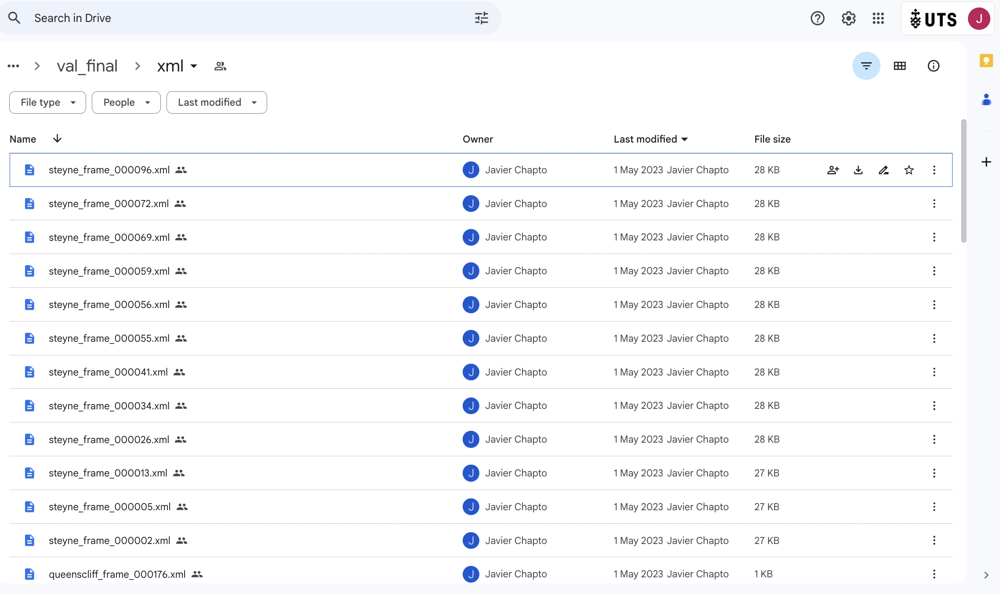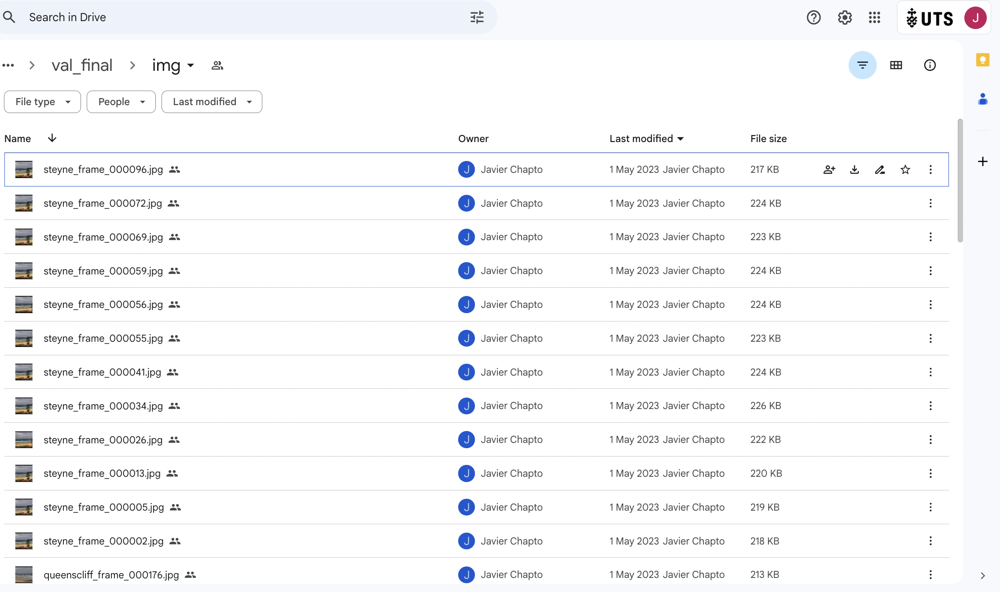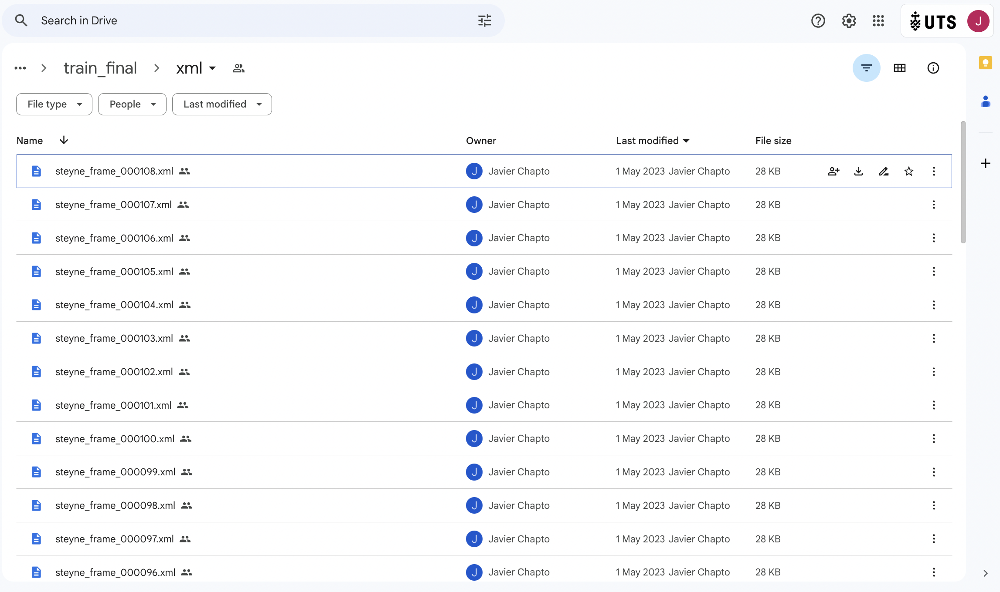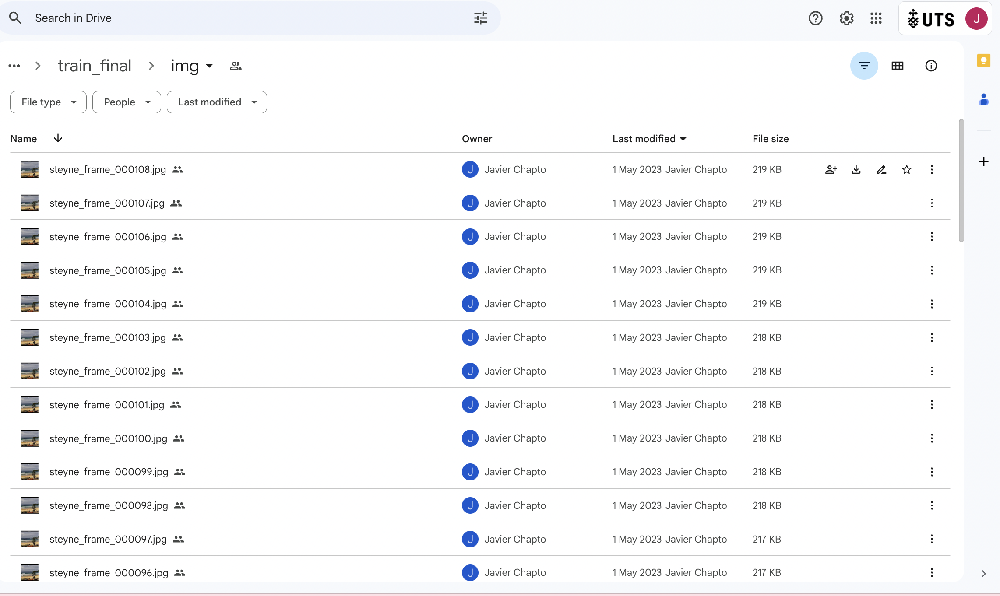

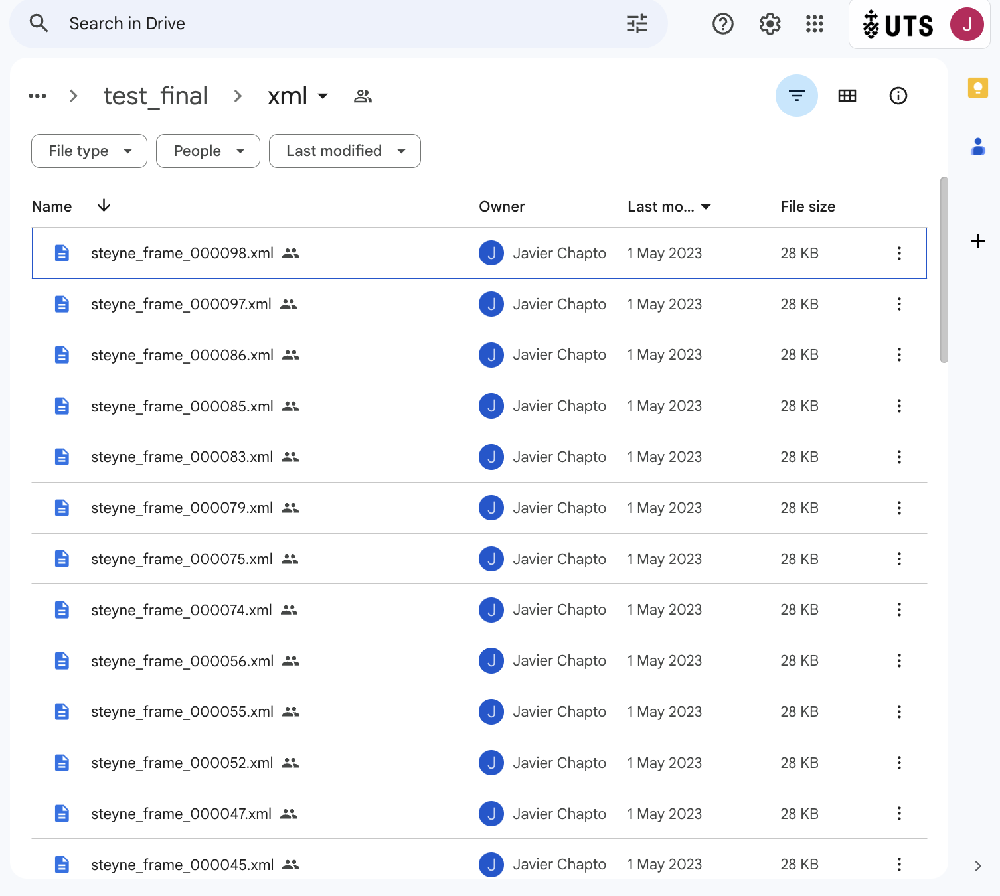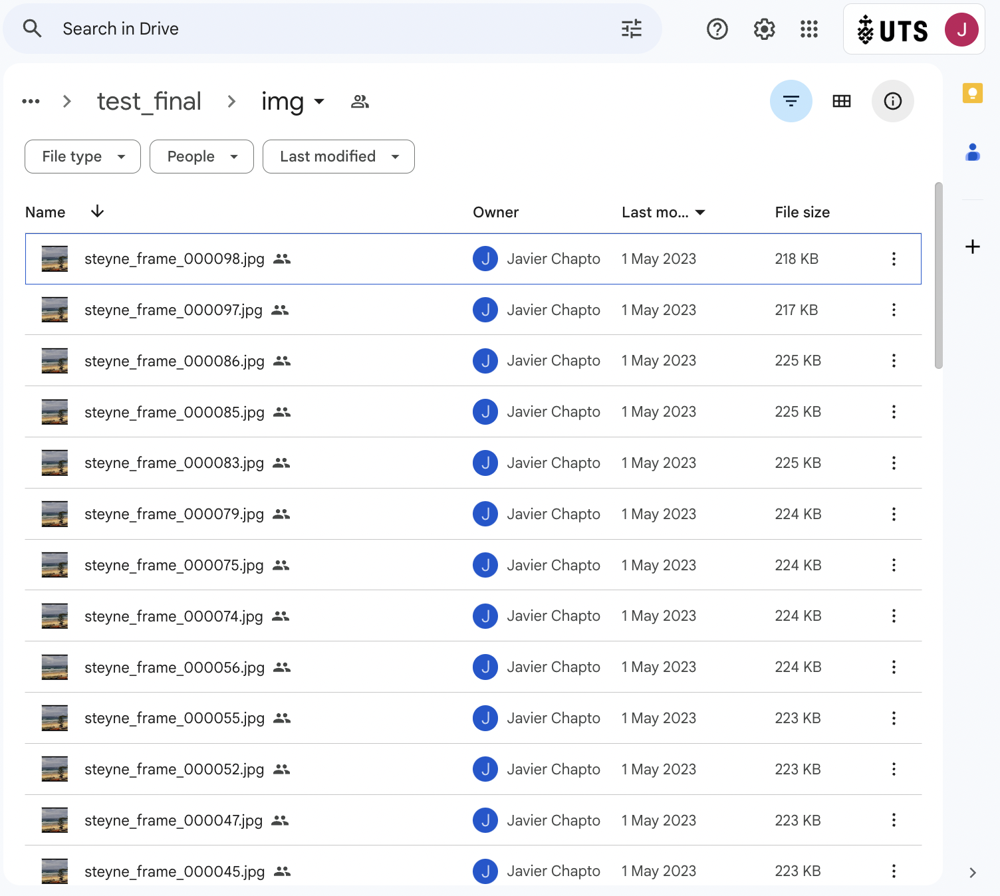

# Step 3.6: Check that only the label person is present in the dataset

In [ ]:
# Get the labels present in the dataset

import os
import xml.etree.ElementTree as ET

# path to the directory containing the XML files
xml_dir = '/content/drive/MyDrive/seagull_eye_dataset/train'


# set to store the labels (no duplicates)
labels_set = set()

# iterate through each XML file in the directory
for filename in os.listdir(xml_dir):
    if filename.endswith('.xml'):
        # parse the XML file
        tree = ET.parse(os.path.join(xml_dir, filename))
        root = tree.getroot()

        # extract the label information
        for obj in root.findall('object'):
            label = obj.find('name').text
            labels_set.add(label)
            
# convert set to list and print
labels = list(labels_set)
print(labels)

['person']


# Step 3.7 Check and delete invalid JPEG files annotations from the datasets

In [ ]:
# SIMPLIFY
from struct import unpack
from tqdm import tqdm
import os


marker_mapping = {
    0xffd8: "Start of Image",
    0xffe0: "Application Default Header",
    0xffdb: "Quantization Table",
    0xffc0: "Start of Frame",
    0xffc4: "Define Huffman Table",
    0xffda: "Start of Scan",
    0xffd9: "End of Image"
}


class JPEG:
    def __init__(self, image_file):
        with open(image_file, 'rb') as f:
            self.img_data = f.read()
    
    def decode(self):
        data = self.img_data
        while(True):
            marker, = unpack(">H", data[0:2])
            # print(marker_mapping.get(marker))
            if marker == 0xffd8:
                data = data[2:]
            elif marker == 0xffd9:
                return
            elif marker == 0xffda:
                data = data[-2:]
            else:
                lenchunk, = unpack(">H", data[2:4])
                data = data[2+lenchunk:]            
            if len(data)==0:
                break        


bads = []
#root_img = "/content/gdrive/MyDrive/42028/Week9/SSD/customTF2/data/images"
#root_annot = "/content/gdrive/MyDrive/42028/Week9/SSD/customTF2/data/annotations"
root_img = '/content/drive/MyDrive/seagull_final/train_final/img'
root_annot = '/content/drive/MyDrive/seagull_final/train_final/xml'
images = os.listdir( root_img )
for img in tqdm(images):
  image = os.path.join(root_img,img)
  image = JPEG(image) 
  try:
    image.decode()   
  except:
    bads.append(img)


for name in bads:
  os.remove(os.path.join(root_img,name))
  os.remove(os.path.join(root_annot,str(name[:-3]+"xml")))

100%|██████████| 1058/1058 [00:14<00:00, 73.95it/s] 


In [ ]:
# SIMPLIFY
from struct import unpack
from tqdm import tqdm
import os


marker_mapping = {
    0xffd8: "Start of Image",
    0xffe0: "Application Default Header",
    0xffdb: "Quantization Table",
    0xffc0: "Start of Frame",
    0xffc4: "Define Huffman Table",
    0xffda: "Start of Scan",
    0xffd9: "End of Image"
}


class JPEG:
    def __init__(self, image_file):
        with open(image_file, 'rb') as f:
            self.img_data = f.read()
    
    def decode(self):
        data = self.img_data
        while(True):
            marker, = unpack(">H", data[0:2])
            # print(marker_mapping.get(marker))
            if marker == 0xffd8:
                data = data[2:]
            elif marker == 0xffd9:
                return
            elif marker == 0xffda:
                data = data[-2:]
            else:
                lenchunk, = unpack(">H", data[2:4])
                data = data[2+lenchunk:]            
            if len(data)==0:
                break        


bads = []
#root_img = "/content/gdrive/MyDrive/42028/Week9/SSD/customTF2/data/images"
#root_annot = "/content/gdrive/MyDrive/42028/Week9/SSD/customTF2/data/annotations"
root_img = '/content/drive/MyDrive/seagull_final/val_final/img'
root_annot = '/content/drive/MyDrive/seagull_final/val_final/xml'
images = os.listdir( root_img )
for img in tqdm(images):
  image = os.path.join(root_img,img)
  image = JPEG(image) 
  try:
    image.decode()   
  except:
    bads.append(img)


for name in bads:
  os.remove(os.path.join(root_img,name))
  os.remove(os.path.join(root_annot,str(name[:-3]+"xml")))

100%|██████████| 223/223 [00:02<00:00, 87.06it/s] 


In [ ]:
# SIMPLIFY
from struct import unpack
from tqdm import tqdm
import os


marker_mapping = {
    0xffd8: "Start of Image",
    0xffe0: "Application Default Header",
    0xffdb: "Quantization Table",
    0xffc0: "Start of Frame",
    0xffc4: "Define Huffman Table",
    0xffda: "Start of Scan",
    0xffd9: "End of Image"
}


class JPEG:
    def __init__(self, image_file):
        with open(image_file, 'rb') as f:
            self.img_data = f.read()
    
    def decode(self):
        data = self.img_data
        while(True):
            marker, = unpack(">H", data[0:2])
            # print(marker_mapping.get(marker))
            if marker == 0xffd8:
                data = data[2:]
            elif marker == 0xffd9:
                return
            elif marker == 0xffda:
                data = data[-2:]
            else:
                lenchunk, = unpack(">H", data[2:4])
                data = data[2+lenchunk:]            
            if len(data)==0:
                break        


bads = []
#root_img = "/content/gdrive/MyDrive/42028/Week9/SSD/customTF2/data/images"
#root_annot = "/content/gdrive/MyDrive/42028/Week9/SSD/customTF2/data/annotations"
root_img = '/content/drive/MyDrive/seagull_final/test_final/img'
root_annot = '/content/drive/MyDrive/seagull_final/test_final/xml'
images = os.listdir( root_img )
for img in tqdm(images):
  image = os.path.join(root_img,img)
  image = JPEG(image) 
  try:
    image.decode()   
  except:
    bads.append(img)


for name in bads:
  os.remove(os.path.join(root_img,name))
  os.remove(os.path.join(root_annot,str(name[:-3]+"xml")))

100%|██████████| 192/192 [00:05<00:00, 37.05it/s]


# Step 4: Create the Custom Dataset YAML File.

In [ ]:
%%writefile data_configs/custom_data.yaml
# Images and labels direcotry should be relative to train.py
TRAIN_DIR_IMAGES: '/content/drive/MyDrive/seagull_final/train_final/img'
TRAIN_DIR_LABELS: '/content/drive/MyDrive/seagull_final/train_final/xml'
VALID_DIR_IMAGES: '/content/drive/MyDrive/seagull_final/val_final/img'
VALID_DIR_LABELS: '/content/drive/MyDrive/seagull_final/val_final/xml'

# Class names.
CLASSES: [
    '__background__',
    'person'
]

# Number of classes (object classes + 1 for background class in Faster RCNN).
NC: 2

# Whether to save the predictions of the validation set while training.
SAVE_VALID_PREDICTION_IMAGES: True

Writing data_configs/custom_data.yaml


# Step 5: Train the model

In [ ]:
!wandb disabled

W&B disabled.


In [ ]:
!python train.py --config data_configs/custom_data.yaml --epochs 15 --model fasterrcnn_resnet50_fpn_v2 --project-name maritime_detection --batch-size 4 --no-mosaic

Not using distributed mode
device cuda
2023-05-01 21:13:32.558187: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-01 21:13:34.948206: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Creating data loaders
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
Number of training samples: 

# Step 6: Visualize Validation Results

In [ ]:
import matplotlib.pyplot as plt
import glob as glob

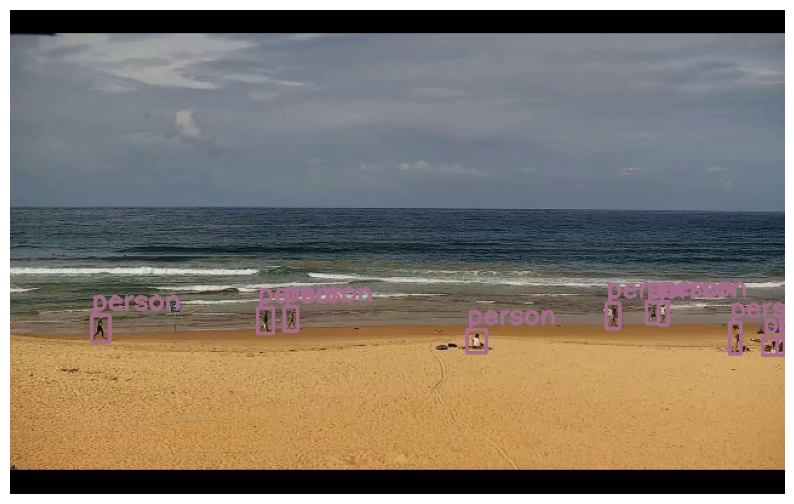

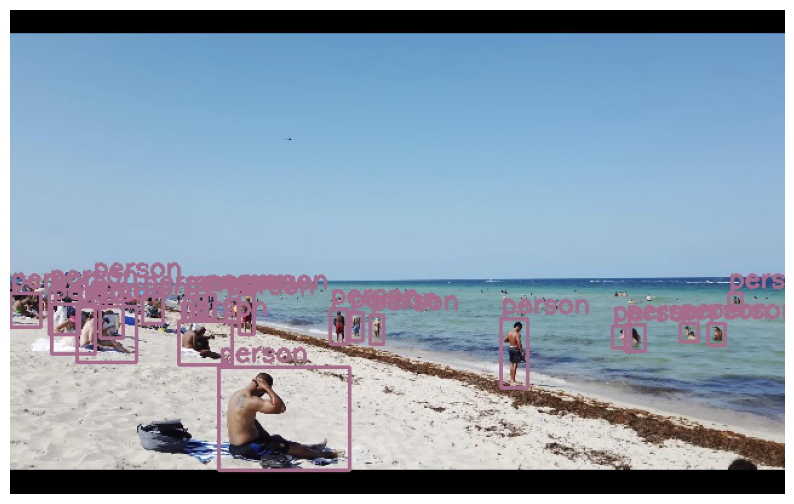

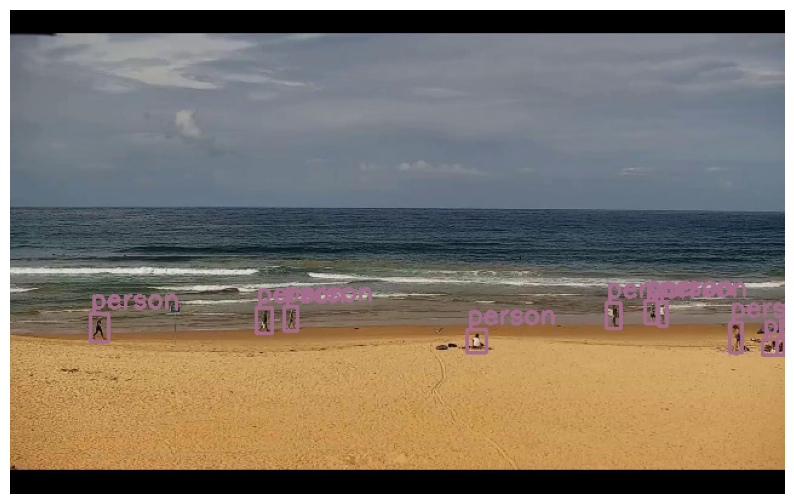

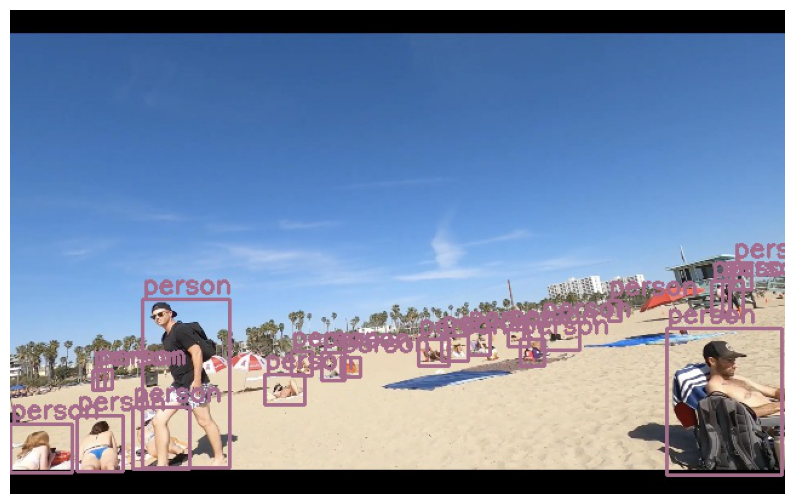

In [ ]:
results_dir_path = '/content/FasterRCNN42028/outputs/training/maritime_detection'
valid_images = glob.glob(f"{results_dir_path}/*.jpg")

for i in range(4):
    plt.figure(figsize=(10, 7))
    image = plt.imread(valid_images[i])
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Step 7: Evaluate results on validation dataset

In [ ]:
# No verbose mAP.
!python eval.py --weights outputs/training/maritime_detection/best_model.pth --config data_configs/custom_data.yaml --model fasterrcnn_resnet50_fpn_v2

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
100% 28/28 [00:41<00:00,  1.47s/it]


{'map': tensor(0.9325),
 'map_50': tensor(0.9901),
 'map_75': tensor(0.9796),
 'map_large': tensor(0.9505),
 'map_medium': tensor(0.7040),
 'map_per_class': tensor(-1.),
 'map_small': tensor(0.9334),
 'mar_1': tensor(0.1226),
 'mar_10': tensor(0.7089),
 'mar_100': tensor(0.9533),
 'mar_100_per_class': tensor(-1.),
 'mar_large': tensor(0.9500),
 'mar_medium': tensor(0.7625),
 'mar_small': tensor(0.9541)}


In [ ]:
!python eval.py --weights outputs/training/maritime_detection/best_model.pth --config data_configs/custom_data.yaml --model fasterrcnn_resnet50_fpn_v2 --verbose

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
100% 28/28 [00:42<00:00,  1.51s/it]


{'map': tensor(0.9325),
 'map_50': tensor(0.9901),
 'map_75': tensor(0.9796),
 'map_large': tensor(0.9505),
 'map_medium': tensor(0.7040),
 'map_per_class': tensor(0.9325),
 'map_small': tensor(0.9334),
 'mar_1': tensor(0.1226),
 'mar_10': tensor(0.7089),
 'mar_100': tensor(0.9533),
 'mar_100_per_class': tensor(0.9533),
 'mar_large': tensor(0.9500),
 'mar_medium': tensor(0.7625),
 'mar_small': tensor(0.9541)}


"Classes: ['__background__', 'person']"


AP / AR per class
------------

# Step 8: Evaluate Results on training dataset



In order to evaluate results on the training dataset, we will change the values of VALID_DIR_IMAGES and VALID_DIR_LABELS to the paths of the training images and labels. In this way, the evaluation will be done on the training dataset.

In [ ]:
%%writefile data_configs/custom_data.yaml
# Images and labels direcotry should be relative to train.py
TRAIN_DIR_IMAGES: '/content/drive/MyDrive/seagull_final/train_final/img'
TRAIN_DIR_LABELS: '/content/drive/MyDrive/seagull_final/train_final/xml'
VALID_DIR_IMAGES: '/content/drive/MyDrive/seagull_final/train_final/img'
VALID_DIR_LABELS: '/content/drive/MyDrive/seagull_final/train_final/xml'

# Class names.
CLASSES: [
    '__background__',
    'person'
]

# Number of classes (object classes + 1 for background class in Faster RCNN).
NC: 2

# Whether to save the predictions of the validation set while training.
SAVE_VALID_PREDICTION_IMAGES: True

Writing data_configs/custom_data.yaml


Now we do the evaluation on the training dataset using the weights we stored on Google Drive.

In [ ]:
!python eval.py --weights /content/drive/MyDrive/seagull_final/weights_faster_rcnn_seagull_eye/best_model.pth --config data_configs/custom_data.yaml --model fasterrcnn_resnet50_fpn_v2 --verbose

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth
100% 167M/167M [00:02<00:00, 87.6MB/s]
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
100% 133/133 [04:26<00:00,  2.00s/it]


{'map': tensor(0.9367),
 'map_50': tensor(0.9901),
 'map_75': tensor(0.9793),
 'map_large': tensor(0.9505),
 'map_medium': tensor(0.7612),
 'map_per_class': tensor(0.9367),
 'map_small': tensor(0.9368),
 'mar_1': tensor(0.0984),
 'mar_10': tensor(0.5913),
 'mar_100':

# Step 9: Evaluate Results on test dataset

In order to evaluate results on the test dataset, we will change the values of VALID_DIR_IMAGES and VALID_DIR_LABELS to the paths of the test images and labels. In this way, the evaluation will be done on the test dataset.

In [ ]:
%%writefile data_configs/custom_data.yaml
# Images and labels direcotry should be relative to train.py
TRAIN_DIR_IMAGES: '/content/drive/MyDrive/seagull_final/train_final/img'
TRAIN_DIR_LABELS: '/content/drive/MyDrive/seagull_final/train_final/xml'
VALID_DIR_IMAGES: '/content/drive/MyDrive/seagull_final/test_final/img'
VALID_DIR_LABELS: '/content/drive/MyDrive/seagull_final/test_final/xml'

# Class names.
CLASSES: [
    '__background__',
    'person'
]

# Number of classes (object classes + 1 for background class in Faster RCNN).
NC: 2

# Whether to save the predictions of the validation set while training.
SAVE_VALID_PREDICTION_IMAGES: True

Overwriting data_configs/custom_data.yaml


In [ ]:
!python eval.py --weights /content/drive/MyDrive/seagull_final/weights_faster_rcnn_seagull_eye/best_model.pth --config data_configs/custom_data.yaml --model fasterrcnn_resnet50_fpn_v2 --verbose

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
100% 24/24 [00:34<00:00,  1.42s/it]


{'map': tensor(0.9371),
 'map_50': tensor(0.9899),
 'map_75': tensor(0.9790),
 'map_large': tensor(-1.),
 'map_medium': tensor(0.9000),
 'map_per_class': tensor(0.9371),
 'map_small': tensor(0.9372),
 'mar_1': tensor(0.0926),
 'mar_10': tensor(0.5670),
 'mar_100': tensor(0.9561),
 'mar_100_per_class': tensor(0.9561),
 'mar_large': tensor(-1.),
 'mar_medium': tensor(0.9000),
 'mar_small': tensor(0.9562)}


"Classes: ['__background__', 'person']"


AP / AR per class
------------------

# Step 10: Make inferences and display result images

In [ ]:
!python inference.py --input /content/drive/MyDrive/seagull_final/230403144720.jpg --weights outputs/training/maritime_detection/best_model.pth

Building from model name arguments...
Test instances: 1
Image 1 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 2.341


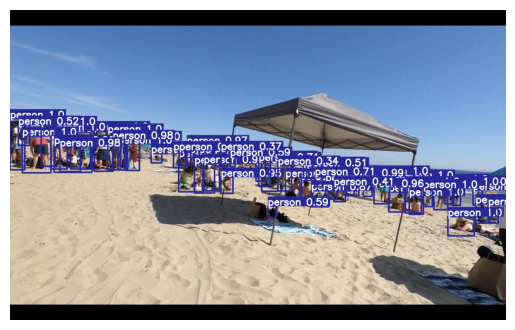

In [ ]:
image = plt.imread('/content/FasterRCNN42028/outputs/inference/res_1/230403144720.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
!python inference.py --input /content/drive/MyDrive/seagull_final/230403151102.jpg --weights outputs/training/maritime_detection/best_model.pth

Building from model name arguments...
Test instances: 1
Image 1 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 1.704


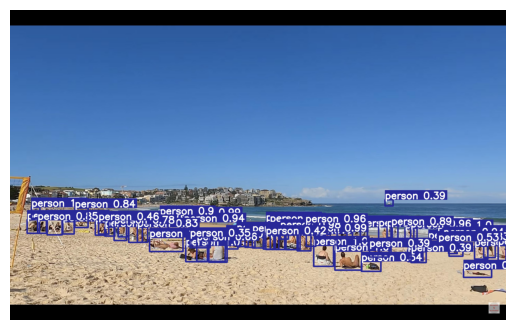

In [ ]:
image = plt.imread('/content/FasterRCNN42028/outputs/inference/res_2/230403151102.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
!python inference.py --input /content/drive/MyDrive/seagull_final/230403151436.jpg --weights outputs/training/maritime_detection/best_model.pth

Building from model name arguments...
Test instances: 1
Image 1 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 2.365


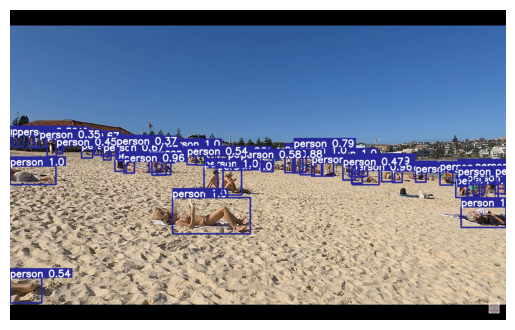

In [ ]:
image = plt.imread('/content/FasterRCNN42028/outputs/inference/res_3/230403151436.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
!python inference.py --input /content/drive/MyDrive/seagull_final/testbeaches1.jpg --weights outputs/training/maritime_detection/best_model.pth

Building from model name arguments...
Test instances: 1
Image 1 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 2.014


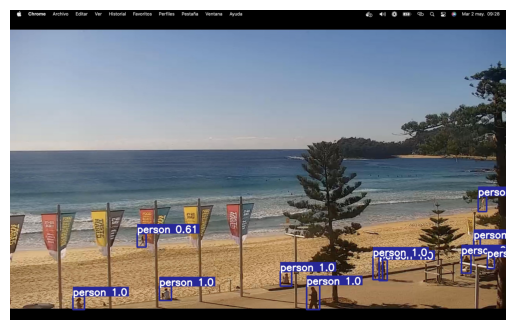

In [ ]:
image = plt.imread('/content/FasterRCNN42028/outputs/inference/res_4/testbeaches1.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
!python inference.py --input /content/drive/MyDrive/seagull_final/test2.jpg --weights outputs/training/maritime_detection/best_model.pth

Building from model name arguments...
Test instances: 1
Image 1 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 2.114


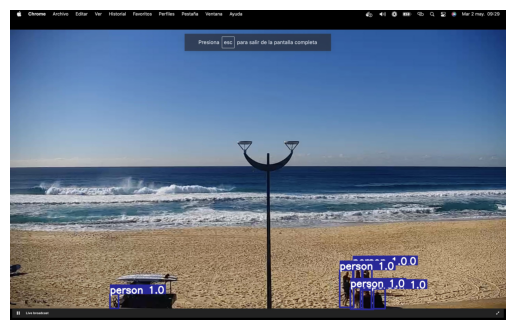

In [ ]:
image = plt.imread('/content/FasterRCNN42028/outputs/inference/res_5/test2.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
!python inference.py --input /content/drive/MyDrive/seagull_final/test3.jpg --weights outputs/training/maritime_detection/best_model.pth

Building from model name arguments...
Test instances: 1
Image 1 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 2.302


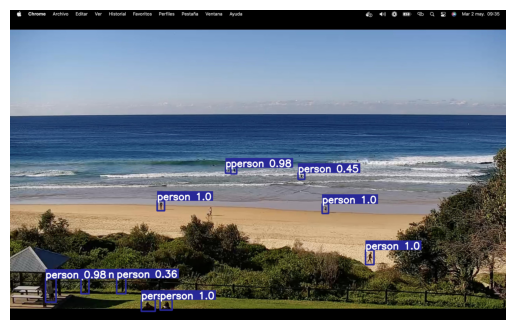

In [ ]:
image = plt.imread('/content/FasterRCNN42028/outputs/inference/res_6/test3.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
!python inference.py --input /content/drive/MyDrive/seagull_final/test4.jpg --weights outputs/training/maritime_detection/best_model.pth

Building from model name arguments...
Test instances: 1
Image 1 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 2.173


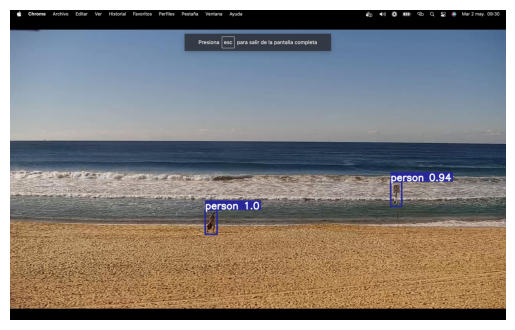

In [ ]:
image = plt.imread('/content/FasterRCNN42028/outputs/inference/res_7/test4.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()